# Azure Computer Vision 4 (Florence)

## Fashion Visual Search - Images embeddings

![Image](florence.jpg)

![Image](fashionheader.png)

<br>
<i>Note: this image was generated with Azure Open AI Dall-e 2</i>

### Visual search with vector embeddings
**Vector embeddings** are a way of representing content such as text or images as vectors of real numbers in a high-dimensional space. These embeddings are often learned from large amounts of textual and visual data using machine learning algorithms like neural networks. Each dimension of the vector corresponds to a different feature or attribute of the content, such as its semantic meaning, syntactic role, or context in which it commonly appears. By representing content as vectors, we can perform mathematical operations on them to compare their similarity or use them as inputs to machine learning models.

![Image](embeddings.jpg)


### Business applications
- **Digital asset management**: Image retrieval can be used to manage large collections of digital images, such as in museums, archives, or online galleries. Users can search for images based on visual features and retrieve the images that match their criteria.
- **Medical image retrieval**: Image retrieval can be used in medical imaging to search for images based on their diagnostic features or disease patterns. This can help doctors or researchers to identify similar cases or track disease progression.
- **Security and surveillance**: Image retrieval can be used in security and surveillance systems to search for images based on specific features or patterns, such as in, people & object tracking, or threat detection.
- **Forensic image retrieval**: Image retrieval can be used in forensic investigations to search for images based on their visual content or metadata, such as in cases of cyber-crime.
- **E-commerce**: Image retrieval can be used in online shopping applications to search for similar products based on their features or descriptions or provide recommendations based on previous purchases.
- **Fashion and design**: Image retrieval can be used in fashion and design to search for images based on their visual features, such as color, pattern, or texture. This can help designers or retailers to identify similar products or trends.

### Visual Search Process
![Image](fashionprocess.png)

### Image Retrieval with Azure Computer Vision Documentation
- https://learn.microsoft.com/en-us/azure/cognitive-services/computer-vision/concept-image-retrieval
- https://learn.microsoft.com/en-us/azure/cognitive-services/computer-vision/how-to/image-retrieval

### Demo images
Demo images are a sample of this collection of images: https://www.kaggle.com/competitions/h-and-m-personalized-fashion-recommendations/data
<br><br>
> Serge Retkowsky | Microsoft | https://github.com/retkowsky | 3rd of May, 2023

In [1]:
!pip install plotly


[notice] A new release of pip available: 22.3.1 -> 23.1.2
[notice] To update, run: pip install --upgrade pip


## 1. <a name="chapt1"></a> Librairies

In [2]:
import datetime
import glob
import json
import multiprocessing
import numpy as np
import nomic
import os
import plotly.express as px
import sys
import time

from concurrent.futures import ThreadPoolExecutor
from dotenv import load_dotenv
from nomic import atlas
from PIL import Image
from tqdm import tqdm
from umap import UMAP

/Users/shiva/NEU/assignments/DAMG7245/Assignment_03/azure_computer_vision_workshop/.venv/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/shiva/NEU/assignments/DAMG7245/Assignment_03/azure_computer_vision_workshop/.venv/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-

In [3]:
load_dotenv("azure.env")

key = os.getenv("azure_cv_key")
endpoint = os.getenv("azure_cv_endpoint")

### Importing our specific functions

In [4]:
pyfile = "azure.py"

print("Python file:", pyfile, "Date:", time.ctime(os.path.getmtime(pyfile)))

Python file: azure.py Date: Thu Jul  6 18:02:06 2023


In [5]:
from azure import (
    image_embedding_batch,
    view_image,
)

## 2. <a name="chapt2"></a> Informations

In [6]:
sys.version

'3.11.3 (v3.11.3:f3909b8bc8, Apr  4 2023, 20:12:10) [Clang 13.0.0 (clang-1300.0.29.30)]'

In [7]:
print("Today is", datetime.datetime.today())

Today is 2023-07-06 21:43:10.338517


## 3. <a name="chapt3"></a> Our products images

In [8]:
IMAGES_DIR = "fashion"

In [9]:
image_files = glob.glob(IMAGES_DIR + "/*")

print("Directory of images:", IMAGES_DIR)
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Directory of images: fashion
Total number of catalog images = 1,473


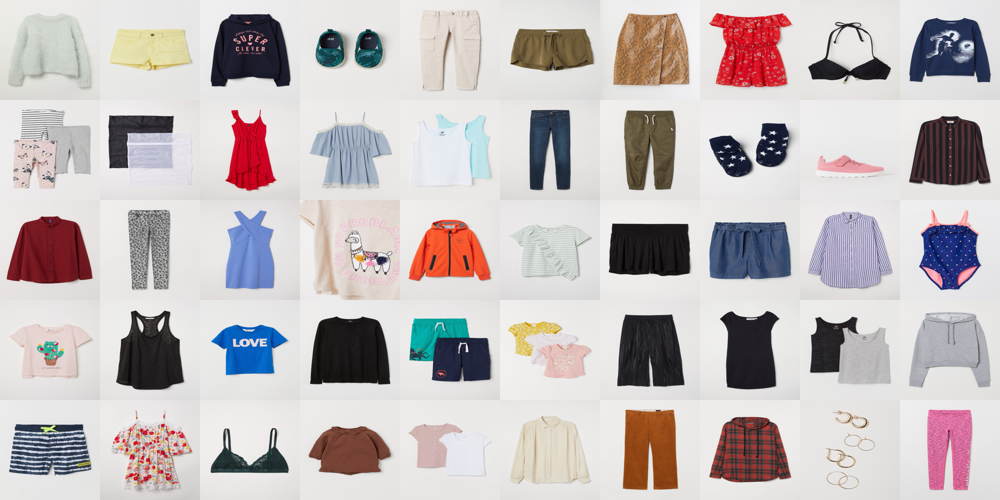

In [10]:
num_images_per_row = 10
num_images_per_col = 5
img_size = 200
start = 1000

samples = image_files[start : start + (num_images_per_row * num_images_per_col)]

samples_images = Image.new(
    "RGB", (num_images_per_row * img_size, num_images_per_col * img_size)
)

# Load and resize the images
sample_images = [
    Image.open(image_file).resize((img_size, img_size)) for image_file in samples
]

# Paste the images onto the new image
for idx, img in enumerate(sample_images):
    x = (idx % num_images_per_row) * img_size
    y = (idx // num_images_per_row) * img_size
    samples_images.paste(img, (x, y))

samples_images

## 4. <a name="chapt4"></a> Vectors embedding generation for the catalog images

In [11]:
num_cores = multiprocessing.cpu_count()

print("Number of CPU cores =", num_cores)

Number of CPU cores = 8


In [12]:
def process_image(image_file, max_retries=20):
    """
    Process image with error management
    """
    num_retries = 0

    while num_retries < max_retries:
        try:
            embedding, response = image_embedding_batch(image_file)

            if response.status_code == 200:
                return embedding

            else:
                num_retries += 1
                print(
                    f"Error processing {image_file}: {response.status_code}.\
                Retrying... (attempt {num_retries} of {max_retries})"
                )

        except Exception as e:
            print(f"An error occurred while processing {image_file}: {e}")
            print(f"Retrying... (attempt {num_retries} of {max_retries})")
            num_retries += 1

    return None

In [13]:
def process_all_images(image_files, max_workers=4, max_retries=20):
    """
    Running the full process using pool
    """
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        embeddings = list(
            tqdm(
                executor.map(lambda x: process_image(x, max_retries), image_files),
                total=len(image_files),
            )
        )

    return [emb for emb in embeddings if emb is not None]

### Running the images vectors embeddings

In [ ]:
print(
    datetime.datetime.today().strftime("%d-%b-%Y %H:%M:%S"),
    "Starting to compute vector embeddings for our",
    "{:,}".format(len(image_files)),
    "catalog images...",
)
start = time.time()

# Running the images vector embeddings for all the images files
list_emb = process_all_images(image_files, max_workers=4, max_retries=20)

# End of job
print(datetime.datetime.today().strftime("%d-%b-%Y %H:%M:%S"), "Done")
elapsed = time.time() - start
print(f"\nElapsed time: {int(elapsed / 60)} minutes, {int(elapsed % 60)} seconds")
print("Number of processed images =", len(list_emb))
print(f"Processing time per image = {(elapsed / len(list_emb)):.5f} sec")

06-Jul-2023 21:43:17 Starting to compute vector embeddings for our 1,473 catalog images...


  0%|                                                                                                                                                                                 | 0/1473 [00:00<?, ?it/s]

An error occurred while processing fashion/0699755023.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699755023.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699755023.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred wh

  0%|                                                                                                                                                                       | 1/1473 [00:15<6:27:27, 15.79s/it]

An error occurred while processing fashion/0628813014.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 19 of 20)


  0%|▏                                                                                                                                                                      | 2/1473 [00:16<2:42:32,  6.63s/it]

An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628813014.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0644678006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628813014.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644678006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

  0%|▌                                                                                                                                                                      | 5/1473 [00:27<1:53:35,  4.64s/it]

An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628813014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0644678006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0644678006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurr

  1%|▉                                                                                                                                                                      | 8/1473 [00:30<1:03:54,  2.62s/it]

An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0644678006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693500002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred 

  1%|█                                                                                                                                                                      | 9/1473 [00:39<1:42:28,  4.20s/it]

An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693500002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693500002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

  1%|█▏                                                                                                                                                                    | 11/1473 [00:46<1:33:13,  3.83s/it]

An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

  1%|█▍                                                                                                                                                                    | 13/1473 [00:52<1:29:05,  3.66s/it]

An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

  1%|█▌                                                                                                                                                                    | 14/1473 [00:55<1:22:17,  3.38s/it]

An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 1 of 20)


  1%|█▋                                                                                                                                                                    | 15/1473 [00:57<1:13:41,  3.03s/it]

An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

  1%|█▊                                                                                                                                                                    | 16/1473 [01:02<1:27:00,  3.58s/it]

An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

  1%|█▉                                                                                                                                                                    | 17/1473 [01:08<1:42:44,  4.23s/it]

An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 7 of 20)


  1%|██                                                                                                                                                                    | 18/1473 [01:09<1:17:58,  3.22s/it]

An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626683001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626683001.jpg: 'vector'
Retrying... (attempt 1 of 20)


  1%|██▏                                                                                                                                                                   | 19/1473 [01:10<1:06:46,  2.76s/it]

An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626683001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626683001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626683001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

  1%|██▎                                                                                                                                                                   | 20/1473 [01:18<1:40:29,  4.15s/it]

An error occurred while processing fashion/0626683001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626683001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626683001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occ

  1%|██▎                                                                                                                                                                   | 21/1473 [01:22<1:40:09,  4.14s/it]

An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurre

  2%|██▌                                                                                                                                                                   | 23/1473 [01:26<1:16:39,  3.17s/it]

An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626592003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626592003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626592003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

  2%|██▋                                                                                                                                                                   | 24/1473 [01:35<1:54:29,  4.74s/it]

An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 0 of 20)


  2%|██▉                                                                                                                                                                   | 26/1473 [01:36<1:09:03,  2.86s/it]

An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627759008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627759008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

  2%|███▏                                                                                                                                                                  | 28/1473 [01:44<1:21:17,  3.38s/it]

An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627759008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0627759008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627759008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error oc

  2%|███▎                                                                                                                                                                  | 29/1473 [01:51<1:37:12,  4.04s/it]

An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626703007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626703007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

  2%|███▌                                                                                                                                                                  | 32/1473 [02:00<1:25:33,  3.56s/it]

An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626703007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626703007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

  2%|███▋                                                                                                                                                                  | 33/1473 [02:03<1:22:42,  3.45s/it]

An error occurred while processing fashion/0626703007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurr

  2%|███▊                                                                                                                                                                  | 34/1473 [02:05<1:16:00,  3.17s/it]

An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697043001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697043001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

  2%|████                                                                                                                                                                  | 36/1473 [02:16<1:36:24,  4.03s/it]

An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697043001.jpg: 'vector'
Retrying... (attempt 13 of 20)


  3%|████▏                                                                                                                                                                 | 37/1473 [02:16<1:19:07,  3.31s/it]

An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697043001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697043001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurr

  3%|████▎                                                                                                                                                                 | 38/1473 [02:20<1:22:03,  3.43s/it]

An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 19 of 20)


  3%|████▍                                                                                                                                                                 | 39/1473 [02:21<1:04:51,  2.71s/it]

An error occurred while processing fashion/0699347001.jpg: 'vector'An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 6 of 20)

Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697043001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624537007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

  3%|████▌                                                                                                                                                                 | 40/1473 [02:30<1:42:25,  4.29s/it]

An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624537007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0643582002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624537007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0643582002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

  3%|████▌                                                                                                                                                                 | 41/1473 [02:33<1:37:48,  4.10s/it]

An error occurred while processing fashion/0624537007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0643582002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624537007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0643582002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 6 of 20)


  3%|████▊                                                                                                                                                                 | 43/1473 [02:35<1:01:59,  2.60s/it]

An error occurred while processing fashion/0620447002.jpg: 'vector'An error occurred while processing fashion/0624537007.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643582002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622878016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643582002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622878016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

  3%|████▉                                                                                                                                                                 | 44/1473 [02:43<1:35:17,  4.00s/it]

An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622878016.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622878016.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622878016.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

  3%|█████▏                                                                                                                                                                | 46/1473 [02:47<1:14:57,  3.15s/it]

An error occurred while processing fashion/0622878016.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622878016.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 7 of 20)


  3%|█████▎                                                                                                                                                                | 47/1473 [02:48<1:04:06,  2.70s/it]

An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622878016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

  3%|█████▍                                                                                                                                                                | 48/1473 [02:58<1:44:02,  4.38s/it]

An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurr

  3%|█████▋                                                                                                                                                                | 50/1473 [03:01<1:16:39,  3.23s/it]

An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'An error occurred while processing fashion/06461

  3%|█████▋                                                                                                                                                                | 51/1473 [03:06<1:26:38,  3.66s/it]

An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 12 of 20)

Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error oc

  4%|█████▊                                                                                                                                                                | 52/1473 [03:11<1:32:17,  3.90s/it]

An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 0 of 20)


  4%|█████▉                                                                                                                                                                | 53/1473 [03:11<1:13:43,  3.12s/it]

An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

  4%|██████▏                                                                                                                                                               | 55/1473 [03:22<1:34:12,  3.99s/it]

An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

  4%|██████▍                                                                                                                                                               | 57/1473 [03:25<1:12:07,  3.06s/it]

An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 4 of 20)


  4%|██████▌                                                                                                                                                                 | 58/1473 [03:25<59:09,  2.51s/it]

An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

  4%|██████▋                                                                                                                                                               | 59/1473 [03:29<1:05:39,  2.79s/it]

An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurre

  4%|██████▊                                                                                                                                                               | 60/1473 [03:35<1:27:42,  3.72s/it]

An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occu

  4%|███████                                                                                                                                                                 | 62/1473 [03:38<59:37,  2.54s/it]

An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred 

  4%|███████                                                                                                                                                               | 63/1473 [03:50<2:00:28,  5.13s/it]

An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 0 of 20)


  4%|███████▏                                                                                                                                                              | 64/1473 [03:51<1:35:28,  4.07s/it]

An error occurred while processing fashion/0622238009.jpg: 'vector'An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 18 of 20)

Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 19 of 20)


  4%|███████▎                                                                                                                                                              | 65/1473 [03:52<1:11:37,  3.05s/it]

An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

  5%|███████▌                                                                                                                                                              | 67/1473 [04:04<1:42:14,  4.36s/it]

An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occ

  5%|███████▊                                                                                                                                                              | 69/1473 [04:11<1:25:45,  3.67s/it]

An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

  5%|████████                                                                                                                                                              | 71/1473 [04:18<1:24:13,  3.60s/it]

An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurre

  5%|████████                                                                                                                                                              | 72/1473 [04:26<1:47:39,  4.61s/it]

An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 2 of 20)


  5%|████████▎                                                                                                                                                             | 74/1473 [04:27<1:09:22,  2.98s/it]

An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

  5%|████████▍                                                                                                                                                             | 75/1473 [04:29<1:05:15,  2.80s/it]

An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'An error occurred while processing fashion/0643308

  5%|████████▌                                                                                                                                                             | 76/1473 [04:38<1:40:13,  4.30s/it]

An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 0 of 20)


  5%|████████▋                                                                                                                                                             | 77/1473 [04:39<1:20:51,  3.48s/it]

An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 0 of 20)


  5%|████████▊                                                                                                                                                             | 78/1473 [04:40<1:03:53,  2.75s/it]

An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698629001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698629001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 2 of 20)

Retrying... (attempt 4 of 20)
An error occurred w

  5%|█████████                                                                                                                                                             | 80/1473 [04:49<1:24:24,  3.64s/it]

An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 14 of 20)


  5%|█████████▏                                                                                                                                                            | 81/1473 [04:50<1:06:12,  2.85s/it]

An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

  6%|█████████▏                                                                                                                                                            | 82/1473 [04:53<1:08:08,  2.94s/it]

An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

  6%|█████████▍                                                                                                                                                            | 84/1473 [05:05<1:40:02,  4.32s/it]

An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 1 of 20)


  6%|█████████▉                                                                                                                                                              | 87/1473 [05:06<56:53,  2.46s/it]

An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

  6%|█████████▉                                                                                                                                                            | 88/1473 [05:12<1:11:31,  3.10s/it]

An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 15 of 20)

Retrying... (attempt 1 of 20)
An error occ

  6%|██████████                                                                                                                                                            | 89/1473 [05:16<1:13:47,  3.20s/it]

An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 16 of 20)


  6%|██████████▏                                                                                                                                                           | 90/1473 [05:17<1:00:17,  2.62s/it]

An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 2 of 20)


  6%|██████████▍                                                                                                                                                             | 91/1473 [05:18<52:26,  2.28s/it]

An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

  6%|██████████▎                                                                                                                                                           | 92/1473 [05:26<1:26:14,  3.75s/it]

An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurr

  6%|██████████▌                                                                                                                                                           | 94/1473 [05:28<1:00:52,  2.65s/it]

An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

  6%|██████████▋                                                                                                                                                           | 95/1473 [05:34<1:17:39,  3.38s/it]

An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

  7%|██████████▊                                                                                                                                                           | 96/1473 [05:39<1:25:15,  3.72s/it]

An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occur

  7%|██████████▉                                                                                                                                                           | 97/1473 [05:44<1:32:39,  4.04s/it]

An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 3 of 20)


  7%|███████████▏                                                                                                                                                          | 99/1473 [05:45<1:01:08,  2.67s/it]

An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred 

  7%|███████████▏                                                                                                                                                         | 100/1473 [05:52<1:24:00,  3.67s/it]

An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error oc

  7%|███████████▎                                                                                                                                                         | 101/1473 [05:58<1:35:05,  4.16s/it]

An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

  7%|███████████▍                                                                                                                                                         | 102/1473 [06:01<1:29:21,  3.91s/it]

An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

  7%|███████████▋                                                                                                                                                         | 104/1473 [06:09<1:29:46,  3.93s/it]

An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

  7%|███████████▊                                                                                                                                                         | 105/1473 [06:13<1:30:36,  3.97s/it]

An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 1 of 20)


  7%|███████████▉                                                                                                                                                         | 107/1473 [06:15<1:00:57,  2.68s/it]

An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695288001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695288001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695288001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

  7%|████████████                                                                                                                                                         | 108/1473 [06:24<1:37:30,  4.29s/it]

An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

  7%|████████████▎                                                                                                                                                        | 110/1473 [06:27<1:05:36,  2.89s/it]

An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred 

  8%|████████████▌                                                                                                                                                        | 112/1473 [06:37<1:26:28,  3.81s/it]

An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 0 of 20)


  8%|████████████▉                                                                                                                                                          | 114/1473 [06:38<58:31,  2.58s/it]

An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

  8%|█████████████                                                                                                                                                          | 115/1473 [06:40<55:29,  2.45s/it]

An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 4 of 20)

Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

  8%|████████████▉                                                                                                                                                        | 116/1473 [06:47<1:18:34,  3.47s/it]

An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error oc

  8%|█████████████                                                                                                                                                        | 117/1473 [06:51<1:20:17,  3.55s/it]

An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625722001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625722001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

  8%|█████████████▍                                                                                                                                                       | 120/1473 [07:01<1:16:18,  3.38s/it]

An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625722001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625722001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occ

  8%|█████████████▌                                                                                                                                                       | 121/1473 [07:05<1:20:16,  3.56s/it]

An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

  8%|█████████████▉                                                                                                                                                       | 124/1473 [07:12<1:08:03,  3.03s/it]

An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

  8%|██████████████                                                                                                                                                       | 125/1473 [07:15<1:06:36,  2.96s/it]

An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

  9%|██████████████                                                                                                                                                       | 126/1473 [07:23<1:31:49,  4.09s/it]

An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

  9%|██████████████▎                                                                                                                                                      | 128/1473 [07:27<1:12:40,  3.24s/it]

An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurr

  9%|██████████████▍                                                                                                                                                      | 129/1473 [07:32<1:22:32,  3.68s/it]

An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

  9%|██████████████▋                                                                                                                                                      | 131/1473 [07:42<1:34:45,  4.24s/it]

An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 0 of 20)

Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occu

  9%|██████████████▊                                                                                                                                                      | 132/1473 [07:45<1:27:50,  3.93s/it]

An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

  9%|██████████████▉                                                                                                                                                      | 133/1473 [07:49<1:28:53,  3.98s/it]

An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 5 of 20)


  9%|███████████████                                                                                                                                                      | 134/1473 [07:50<1:11:06,  3.19s/it]

An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

  9%|███████████████                                                                                                                                                      | 135/1473 [07:56<1:27:13,  3.91s/it]

An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurre

  9%|███████████████▏                                                                                                                                                     | 136/1473 [08:01<1:33:25,  4.19s/it]

An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

  9%|███████████████▎                                                                                                                                                     | 137/1473 [08:05<1:33:32,  4.20s/it]

An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 0 of 20)


  9%|███████████████▍                                                                                                                                                     | 138/1473 [08:06<1:13:12,  3.29s/it]

An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

  9%|███████████████▌                                                                                                                                                     | 139/1473 [08:10<1:14:47,  3.36s/it]

An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 10%|███████████████▋                                                                                                                                                     | 140/1473 [08:16<1:31:58,  4.14s/it]

An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 10%|███████████████▊                                                                                                                                                     | 141/1473 [08:21<1:40:25,  4.52s/it]

An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 7 of 20)


 10%|███████████████▉                                                                                                                                                     | 142/1473 [08:22<1:13:30,  3.31s/it]

An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurre

 10%|████████████████                                                                                                                                                     | 143/1473 [08:26<1:18:03,  3.52s/it]

An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 10%|████████████████▏                                                                                                                                                    | 144/1473 [08:30<1:20:56,  3.65s/it]

An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occur

 10%|████████████████▏                                                                                                                                                    | 145/1473 [08:37<1:46:37,  4.82s/it]

An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 10%|████████████████▍                                                                                                                                                    | 147/1473 [08:41<1:17:35,  3.51s/it]

An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurr

 10%|████████████████▌                                                                                                                                                    | 148/1473 [08:46<1:25:01,  3.85s/it]

An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 10%|████████████████▋                                                                                                                                                    | 149/1473 [08:48<1:14:02,  3.36s/it]

An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0394522001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'An error occurred while processing fashion/0394522001.jpg: 'vector'
Retrying... (attempt 1 of 20)

Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurr

 10%|████████████████▊                                                                                                                                                    | 150/1473 [08:55<1:35:51,  4.35s/it]

An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0394522001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0394522001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0394522001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occur

 10%|█████████████████                                                                                                                                                    | 152/1473 [09:00<1:15:56,  3.45s/it]

An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626813009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626813009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 10%|█████████████████▍                                                                                                                                                     | 154/1473 [09:02<57:49,  2.63s/it]

An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626813009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626813009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691761001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626813009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0691761001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 11%|█████████████████▎                                                                                                                                                   | 155/1473 [09:09<1:15:55,  3.46s/it]

An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626813009.jpg: 'vector'
Retrying... (attempt 19 of 20)


 11%|█████████████████▋                                                                                                                                                     | 156/1473 [09:09<59:29,  2.71s/it]

An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691761001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0393447010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649271001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645920007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649271001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691761001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0393447010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645920007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649271001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 11%|█████████████████▋                                                                                                                                                   | 158/1473 [09:18<1:15:17,  3.44s/it]

An error occurred while processing fashion/0393447010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0691761001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645920007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649271001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0393447010.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0645920007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0393447010.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occu

 11%|█████████████████▊                                                                                                                                                   | 159/1473 [09:24<1:29:46,  4.10s/it]

An error occurred while processing fashion/0393447010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 11%|██████████████████▏                                                                                                                                                  | 162/1473 [09:32<1:12:45,  3.33s/it]

An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646801002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646801002.jpg: 'vector'
Retrying... (attempt 1 of 20)


 11%|██████████████████▎                                                                                                                                                  | 163/1473 [09:34<1:05:25,  3.00s/it]

An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646801002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646801002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 11%|██████████████████▎                                                                                                                                                  | 164/1473 [09:40<1:21:31,  3.74s/it]

An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646801002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646801002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 11%|██████████████████▌                                                                                                                                                  | 166/1473 [09:48<1:24:34,  3.88s/it]

An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646801002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 11%|██████████████████▊                                                                                                                                                  | 168/1473 [09:52<1:10:39,  3.25s/it]

An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 11%|██████████████████▉                                                                                                                                                  | 169/1473 [10:02<1:36:08,  4.42s/it]

An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 12%|███████████████████▎                                                                                                                                                 | 172/1473 [10:06<1:06:49,  3.08s/it]

An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 12%|███████████████████▍                                                                                                                                                 | 173/1473 [10:15<1:31:10,  4.21s/it]

An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698394002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698394002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 12%|███████████████████▋                                                                                                                                                 | 176/1473 [10:21<1:09:30,  3.22s/it]

An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698394002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698394002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurr

 12%|███████████████████▊                                                                                                                                                 | 177/1473 [10:30<1:28:44,  4.11s/it]

An error occurred while processing fashion/0698394002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698394002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 8 of 20)


 12%|████████████████████                                                                                                                                                 | 179/1473 [10:31<1:05:46,  3.05s/it]

An error occurred while processing fashion/0698394002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642971002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642971002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

 12%|████████████████████▏                                                                                                                                                | 180/1473 [10:39<1:24:26,  3.92s/it]

An error occurred while processing fashion/0642971002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642971002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642971002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 12%|████████████████████▍                                                                                                                                                | 182/1473 [10:45<1:17:28,  3.60s/it]

An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640743005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640743005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred

 12%|████████████████████▌                                                                                                                                                | 184/1473 [10:52<1:17:35,  3.61s/it]

An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 19 of 20)


 13%|████████████████████▋                                                                                                                                                | 185/1473 [10:53<1:03:53,  2.98s/it]

An error occurred while processing fashion/0640743005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697317001.jpg: 'vector'An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 0 of 20)

Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640743005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurr

 13%|████████████████████▊                                                                                                                                                | 186/1473 [10:58<1:15:37,  3.53s/it]

An error occurred while processing fashion/0640743005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 11 of 20)


 13%|████████████████████▉                                                                                                                                                | 187/1473 [11:00<1:08:00,  3.17s/it]

An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occu

 13%|█████████████████████                                                                                                                                                | 188/1473 [11:04<1:12:55,  3.41s/it]

An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 13%|█████████████████████▏                                                                                                                                               | 189/1473 [11:07<1:06:26,  3.11s/it]

An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 13%|█████████████████████▎                                                                                                                                               | 190/1473 [11:18<1:53:01,  5.29s/it]

An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693510001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693510001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 13%|█████████████████████▌                                                                                                                                               | 193/1473 [11:23<1:13:01,  3.42s/it]

An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693510001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693510001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 13%|█████████████████████▋                                                                                                                                               | 194/1473 [11:30<1:26:33,  4.06s/it]

An error occurred while processing fashion/0693510001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 9 of 20)


 13%|█████████████████████▊                                                                                                                                               | 195/1473 [11:30<1:08:07,  3.20s/it]

An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 1 of 20)

Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurr

 13%|█████████████████████▉                                                                                                                                               | 196/1473 [11:34<1:11:36,  3.36s/it]

An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 13%|██████████████████████                                                                                                                                               | 197/1473 [11:37<1:09:16,  3.26s/it]

An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 13%|██████████████████████▏                                                                                                                                              | 198/1473 [11:43<1:27:35,  4.12s/it]

An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 9 of 20)


 14%|██████████████████████▎                                                                                                                                              | 199/1473 [11:44<1:05:13,  3.07s/it]

An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 14%|██████████████████████▍                                                                                                                                              | 200/1473 [11:47<1:08:45,  3.24s/it]

An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 14%|██████████████████████▌                                                                                                                                              | 201/1473 [11:50<1:05:45,  3.10s/it]

An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurre

 14%|██████████████████████▋                                                                                                                                              | 202/1473 [11:57<1:28:36,  4.18s/it]

An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

 14%|██████████████████████▋                                                                                                                                              | 203/1473 [12:00<1:24:05,  3.97s/it]

An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 14%|██████████████████████▊                                                                                                                                              | 204/1473 [12:04<1:23:50,  3.96s/it]

An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 14%|██████████████████████▉                                                                                                                                              | 205/1473 [12:06<1:11:57,  3.40s/it]

An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurre

 14%|███████████████████████                                                                                                                                              | 206/1473 [12:11<1:17:27,  3.67s/it]

An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0641008016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641008016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurre

 14%|███████████████████████▏                                                                                                                                             | 207/1473 [12:14<1:17:02,  3.65s/it]

An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641008016.jpg: 'vector'An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 10 of 20)

Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0641008016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0641008016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 14%|███████████████████████▎                                                                                                                                             | 208/1473 [12:20<1:31:30,  4.34s/it]

An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 19 of 20)


 14%|███████████████████████▍                                                                                                                                             | 209/1473 [12:21<1:08:29,  3.25s/it]

An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 14%|███████████████████████▋                                                                                                                                             | 211/1473 [12:28<1:13:32,  3.50s/it]

An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 14%|███████████████████████▋                                                                                                                                             | 212/1473 [12:35<1:27:26,  4.16s/it]

An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 15%|████████████████████████                                                                                                                                             | 215/1473 [12:42<1:08:58,  3.29s/it]

An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occu

 15%|████████████████████████▏                                                                                                                                            | 216/1473 [12:47<1:16:53,  3.67s/it]

An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 6 of 20)


 15%|████████████████████████▎                                                                                                                                            | 217/1473 [12:48<1:02:02,  2.96s/it]

An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 15%|████████████████████████▋                                                                                                                                              | 218/1473 [12:50<59:05,  2.83s/it]

An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred 

 15%|████████████████████████▌                                                                                                                                            | 219/1473 [12:59<1:30:21,  4.32s/it]

An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626648001.jpg: 'vector'An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 0 of 20)

Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occu

 15%|████████████████████████▋                                                                                                                                            | 220/1473 [13:02<1:24:47,  4.06s/it]

An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 15%|████████████████████████▊                                                                                                                                            | 221/1473 [13:07<1:28:13,  4.23s/it]

An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 11 of 20)

Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 15%|████████████████████████▉                                                                                                                                            | 223/1473 [13:13<1:16:55,  3.69s/it]

An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 19 of 20)


 15%|█████████████████████████                                                                                                                                            | 224/1473 [13:13<1:00:50,  2.92s/it]

An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 15%|█████████████████████████▏                                                                                                                                           | 225/1473 [13:18<1:11:44,  3.45s/it]

An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 15%|█████████████████████████▎                                                                                                                                           | 226/1473 [13:22<1:10:23,  3.39s/it]

An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occu

 15%|█████████████████████████▍                                                                                                                                           | 227/1473 [13:24<1:07:08,  3.23s/it]

An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 16%|█████████████████████████▋                                                                                                                                           | 229/1473 [13:32<1:12:10,  3.48s/it]

An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error oc

 16%|█████████████████████████▊                                                                                                                                           | 230/1473 [13:37<1:17:53,  3.76s/it]

An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 18 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 6 of 20)


 16%|█████████████████████████▉                                                                                                                                           | 231/1473 [13:38<1:05:26,  3.16s/it]

An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 16%|██████████████████████████                                                                                                                                           | 233/1473 [13:47<1:18:53,  3.82s/it]

An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occ

 16%|██████████████████████████▏                                                                                                                                          | 234/1473 [13:51<1:15:40,  3.66s/it]

An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurr

 16%|██████████████████████████▎                                                                                                                                          | 235/1473 [13:54<1:13:34,  3.57s/it]

An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 16%|██████████████████████████▌                                                                                                                                          | 237/1473 [14:02<1:19:05,  3.84s/it]

An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occu

 16%|███████████████████████████                                                                                                                                            | 239/1473 [14:04<56:59,  2.77s/it]

An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 16%|██████████████████████████▉                                                                                                                                          | 240/1473 [14:08<1:00:40,  2.95s/it]

An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646779002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646779002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 16%|██████████████████████████▉                                                                                                                                          | 241/1473 [14:15<1:18:16,  3.81s/it]

An error occurred while processing fashion/0646779002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'An error occurred while processing fashion/0646779002.jpg: 'vector'
Retrying... (attempt 8 of 20)

Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 16%|███████████████████████████                                                                                                                                          | 242/1473 [14:18<1:16:59,  3.75s/it]

An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646779002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0393447015.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646779002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0393447015.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

 17%|███████████████████████████▎                                                                                                                                         | 244/1473 [14:24<1:09:56,  3.41s/it]

An error occurred while processing fashion/0646779002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0393447015.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0393447015.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0393447015.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 17%|███████████████████████████▍                                                                                                                                         | 245/1473 [14:32<1:30:36,  4.43s/it]

An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 19 of 20)


 17%|███████████████████████████▌                                                                                                                                         | 246/1473 [14:32<1:09:16,  3.39s/it]

An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0393447015.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

 17%|███████████████████████████▋                                                                                                                                         | 247/1473 [14:35<1:08:46,  3.37s/it]

An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred

 17%|███████████████████████████▊                                                                                                                                         | 248/1473 [14:41<1:22:02,  4.02s/it]

An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 17%|███████████████████████████▉                                                                                                                                         | 249/1473 [14:46<1:29:27,  4.38s/it]

An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 17%|████████████████████████████                                                                                                                                         | 251/1473 [14:49<1:00:55,  2.99s/it]

An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 17%|████████████████████████████▏                                                                                                                                        | 252/1473 [14:55<1:17:30,  3.81s/it]

An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 10 of 20)

Retrying... (attempt 1 of 20)
An error occur

 17%|████████████████████████████▎                                                                                                                                        | 253/1473 [14:58<1:10:44,  3.48s/it]

An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 13 of 20)

Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 17%|████████████████████████████▍                                                                                                                                        | 254/1473 [15:03<1:19:35,  3.92s/it]

An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 17%|████████████████████████████▋                                                                                                                                        | 256/1473 [15:09<1:11:51,  3.54s/it]

An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 17%|████████████████████████████▊                                                                                                                                        | 257/1473 [15:15<1:23:51,  4.14s/it]

An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 9 of 20)


 18%|████████████████████████████▉                                                                                                                                        | 258/1473 [15:16<1:09:14,  3.42s/it]

An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 10 of 20)


 18%|█████████████████████████████▎                                                                                                                                         | 259/1473 [15:17<55:07,  2.72s/it]

An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 18%|█████████████████████████████                                                                                                                                        | 260/1473 [15:23<1:11:55,  3.56s/it]

An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 18%|█████████████████████████████▏                                                                                                                                       | 261/1473 [15:29<1:27:51,  4.35s/it]

An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occur

 18%|█████████████████████████████▎                                                                                                                                       | 262/1473 [15:32<1:20:40,  4.00s/it]

An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 14 of 20)


 18%|█████████████████████████████▍                                                                                                                                       | 263/1473 [15:34<1:05:14,  3.24s/it]

An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 15 of 20)

Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 18%|█████████████████████████████▌                                                                                                                                       | 264/1473 [15:38<1:10:21,  3.49s/it]

An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 18%|█████████████████████████████▋                                                                                                                                       | 265/1473 [15:43<1:21:09,  4.03s/it]

An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 18%|█████████████████████████████▊                                                                                                                                       | 266/1473 [15:50<1:36:52,  4.82s/it]

An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 16 of 20)


 18%|█████████████████████████████▉                                                                                                                                       | 267/1473 [15:50<1:10:16,  3.50s/it]

An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 18%|██████████████████████████████                                                                                                                                       | 268/1473 [15:52<1:01:00,  3.04s/it]

An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699200005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699200005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurre

 18%|██████████████████████████████▍                                                                                                                                        | 269/1473 [15:55<59:29,  2.96s/it]

An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699200005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699200005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 18%|██████████████████████████████▏                                                                                                                                      | 270/1473 [16:08<2:00:28,  6.01s/it]

An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 3 of 20)


 19%|██████████████████████████████▉                                                                                                                                        | 273/1473 [16:09<54:49,  2.74s/it]

An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 19%|██████████████████████████████▋                                                                                                                                      | 274/1473 [16:16<1:14:02,  3.71s/it]

An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 19%|██████████████████████████████▊                                                                                                                                      | 275/1473 [16:23<1:27:10,  4.37s/it]

An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 19 of 20)


 19%|██████████████████████████████▉                                                                                                                                      | 276/1473 [16:23<1:06:46,  3.35s/it]

An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 10 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 19%|███████████████████████████████▏                                                                                                                                     | 278/1473 [16:30<1:07:28,  3.39s/it]

An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occur

 19%|███████████████████████████████▎                                                                                                                                     | 279/1473 [16:34<1:11:31,  3.59s/it]

An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurr

 19%|███████████████████████████████▎                                                                                                                                     | 280/1473 [16:38<1:12:47,  3.66s/it]

An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 19%|███████████████████████████████▌                                                                                                                                     | 282/1473 [16:45<1:11:09,  3.59s/it]

An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 19%|███████████████████████████████▋                                                                                                                                     | 283/1473 [16:48<1:08:25,  3.45s/it]

An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 19%|████████████████████████████████▎                                                                                                                                      | 285/1473 [16:52<55:40,  2.81s/it]

An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurr

 19%|████████████████████████████████                                                                                                                                     | 286/1473 [16:56<1:04:24,  3.26s/it]

An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 19%|████████████████████████████████▏                                                                                                                                    | 287/1473 [16:59<1:02:23,  3.16s/it]

An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 1 of 20)

Retrying... (attempt 5 of 20)
An error occurr

 20%|████████████████████████████████▋                                                                                                                                      | 288/1473 [17:02<58:05,  2.94s/it]

An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurre

 20%|████████████████████████████████▎                                                                                                                                    | 289/1473 [17:06<1:06:43,  3.38s/it]

An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 20%|████████████████████████████████▍                                                                                                                                    | 290/1473 [17:10<1:10:28,  3.57s/it]

An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occur

 20%|████████████████████████████████▌                                                                                                                                    | 291/1473 [17:13<1:04:49,  3.29s/it]

An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 20%|█████████████████████████████████                                                                                                                                      | 292/1473 [17:15<59:55,  3.04s/it]

An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'An error occurred while processing fashion/06200

 20%|████████████████████████████████▊                                                                                                                                    | 293/1473 [17:20<1:08:10,  3.47s/it]

An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 20%|████████████████████████████████▉                                                                                                                                    | 294/1473 [17:26<1:24:31,  4.30s/it]

An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 15 of 20)


 20%|█████████████████████████████████                                                                                                                                    | 295/1473 [17:27<1:02:40,  3.19s/it]

An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 20%|█████████████████████████████████▌                                                                                                                                     | 296/1473 [17:29<57:59,  2.96s/it]

An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 20%|█████████████████████████████████▎                                                                                                                                   | 297/1473 [17:35<1:17:12,  3.94s/it]

An error occurred while processing fashion/0626648002.jpg: 'vector'An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 13 of 20)

Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occur

 20%|█████████████████████████████████▍                                                                                                                                   | 298/1473 [17:40<1:19:42,  4.07s/it]

An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 7 of 20)


 20%|█████████████████████████████████▉                                                                                                                                     | 299/1473 [17:40<59:48,  3.06s/it]

An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 1 of 20)

Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 20%|██████████████████████████████████                                                                                                                                     | 300/1473 [17:43<58:42,  3.00s/it]

An error occurred while processing fashion/0627554023.jpg: 'vector'An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 3 of 20)

Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 20%|█████████████████████████████████▋                                                                                                                                   | 301/1473 [17:47<1:01:19,  3.14s/it]

An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 10 of 20)

Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurre

 21%|█████████████████████████████████▊                                                                                                                                   | 302/1473 [17:53<1:21:41,  4.19s/it]

An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 11 of 20)


 21%|█████████████████████████████████▉                                                                                                                                   | 303/1473 [17:54<1:00:28,  3.10s/it]

An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 21%|██████████████████████████████████▍                                                                                                                                    | 304/1473 [17:55<46:35,  2.39s/it]

An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 2 of 20)

Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 21%|██████████████████████████████████▌                                                                                                                                    | 305/1473 [17:58<53:30,  2.75s/it]

An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred 

 21%|██████████████████████████████████▎                                                                                                                                  | 306/1473 [18:09<1:43:07,  5.30s/it]

An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

 21%|██████████████████████████████████▌                                                                                                                                  | 309/1473 [18:14<1:03:03,  3.25s/it]

An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurr

 21%|██████████████████████████████████▋                                                                                                                                  | 310/1473 [18:18<1:02:37,  3.23s/it]

An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurr

 21%|██████████████████████████████████▊                                                                                                                                  | 311/1473 [18:21<1:01:35,  3.18s/it]

An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 21%|██████████████████████████████████▉                                                                                                                                  | 312/1473 [18:25<1:05:04,  3.36s/it]

An error occurred while processing fashion/0695748002.jpg: 'vector'An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 0 of 20)

Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 21%|███████████████████████████████████                                                                                                                                  | 313/1473 [18:29<1:09:19,  3.59s/it]

An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 21%|███████████████████████████████████▏                                                                                                                                 | 314/1473 [18:33<1:11:16,  3.69s/it]

An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 21%|███████████████████████████████████▎                                                                                                                                 | 315/1473 [18:37<1:16:57,  3.99s/it]

An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 21%|███████████████████████████████████▊                                                                                                                                   | 316/1473 [18:38<59:59,  3.11s/it]

An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 22%|███████████████████████████████████▌                                                                                                                                 | 318/1473 [18:48<1:15:58,  3.95s/it]

An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 14 of 20)

Retrying... (attempt 1 of 20)
An error occur

 22%|███████████████████████████████████▋                                                                                                                                 | 319/1473 [18:54<1:24:45,  4.41s/it]

An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 0 of 20)

Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 22%|███████████████████████████████████▊                                                                                                                                 | 320/1473 [18:58<1:20:15,  4.18s/it]

An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 1 of 20)

Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred 

 22%|████████████████████████████████████                                                                                                                                 | 322/1473 [19:04<1:12:13,  3.76s/it]

An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occu

 22%|████████████████████████████████████▏                                                                                                                                | 323/1473 [19:07<1:09:10,  3.61s/it]

An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 22%|████████████████████████████████████▌                                                                                                                                | 326/1473 [19:16<1:03:52,  3.34s/it]

An error occurred while processing fashion/0622544001.jpg: 'vector'An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 22%|█████████████████████████████████████                                                                                                                                  | 327/1473 [19:18<57:03,  2.99s/it]

An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 19 of 20)


 22%|█████████████████████████████████████▏                                                                                                                                 | 328/1473 [19:18<46:15,  2.42s/it]

An error occurred while processing fashion/0625803002.jpg: 'vector'An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 2 of 20)

Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 22%|█████████████████████████████████████▎                                                                                                                                 | 329/1473 [19:21<47:57,  2.52s/it]

An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 22%|████████████████████████████████████▉                                                                                                                                | 330/1473 [19:28<1:09:07,  3.63s/it]

An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occu

 22%|█████████████████████████████████████                                                                                                                                | 331/1473 [19:32<1:09:24,  3.65s/it]

An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 12 of 20)


 23%|█████████████████████████████████████▋                                                                                                                                 | 332/1473 [19:32<52:26,  2.76s/it]

An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691671002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691671002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691671002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 23%|█████████████████████████████████████▎                                                                                                                               | 333/1473 [19:37<1:05:26,  3.44s/it]

An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691671002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0691671002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691671002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occur

 23%|█████████████████████████████████████▍                                                                                                                               | 334/1473 [19:42<1:12:50,  3.84s/it]

An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691671002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691671002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 14 of 20)


 23%|█████████████████████████████████████▉                                                                                                                                 | 335/1473 [19:43<58:54,  3.11s/it]

An error occurred while processing fashion/0691671002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 23%|█████████████████████████████████████▋                                                                                                                               | 336/1473 [19:47<1:01:12,  3.23s/it]

An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 23%|█████████████████████████████████████▋                                                                                                                               | 337/1473 [19:53<1:18:55,  4.17s/it]

An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error oc

 23%|█████████████████████████████████████▊                                                                                                                               | 338/1473 [19:56<1:10:59,  3.75s/it]

An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 23%|█████████████████████████████████████▉                                                                                                                               | 339/1473 [20:00<1:09:24,  3.67s/it]

An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred w

 23%|██████████████████████████████████████▎                                                                                                                              | 342/1473 [20:11<1:04:28,  3.42s/it]

An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 23%|███████████████████████████████████████                                                                                                                                | 344/1473 [20:14<50:32,  2.69s/it]

An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 23%|██████████████████████████████████████▋                                                                                                                              | 345/1473 [20:27<1:36:22,  5.13s/it]

An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641972002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641972002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurre

 24%|███████████████████████████████████████▍                                                                                                                               | 348/1473 [20:31<58:43,  3.13s/it]

An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641972002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0641972002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 24%|███████████████████████████████████████                                                                                                                              | 349/1473 [20:37<1:10:31,  3.76s/it]

An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0641972002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 14 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 24%|███████████████████████████████████████▏                                                                                                                             | 350/1473 [20:40<1:08:34,  3.66s/it]

An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 14 of 20)


 24%|███████████████████████████████████████▊                                                                                                                               | 351/1473 [20:41<56:02,  3.00s/it]

An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 24%|███████████████████████████████████████▉                                                                                                                               | 352/1473 [20:44<55:27,  2.97s/it]

An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred

 24%|███████████████████████████████████████▌                                                                                                                             | 353/1473 [20:52<1:17:55,  4.17s/it]

An error occurred while processing fashion/0626257013.jpg: 'vector'An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 12 of 20)

Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623980021.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'An error occurred while processing fashion/

 24%|███████████████████████████████████████▋                                                                                                                             | 354/1473 [20:57<1:24:49,  4.55s/it]

An error occurred while processing fashion/0623980021.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625671001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625671001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623980021.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625671001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623980021.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred 

 24%|███████████████████████████████████████▉                                                                                                                             | 357/1473 [21:05<1:05:59,  3.55s/it]

An error occurred while processing fashion/0623980021.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 24%|████████████████████████████████████████▏                                                                                                                            | 359/1473 [21:11<1:00:28,  3.26s/it]

An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 9 of 20)


 24%|████████████████████████████████████████▊                                                                                                                              | 360/1473 [21:12<54:47,  2.95s/it]

An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurr

 25%|████████████████████████████████████████▍                                                                                                                            | 361/1473 [21:18<1:06:15,  3.57s/it]

An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 9 of 20)


 25%|█████████████████████████████████████████                                                                                                                              | 362/1473 [21:19<53:28,  2.89s/it]

An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurre

 25%|████████████████████████████████████████▋                                                                                                                            | 363/1473 [21:27<1:16:02,  4.11s/it]

An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 25%|████████████████████████████████████████▉                                                                                                                            | 365/1473 [21:32<1:04:51,  3.51s/it]

An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 25%|█████████████████████████████████████████▍                                                                                                                             | 366/1473 [21:32<52:21,  2.84s/it]

An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred 

 25%|█████████████████████████████████████████                                                                                                                            | 367/1473 [21:40<1:11:57,  3.90s/it]

An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 15 of 20)


 25%|█████████████████████████████████████████▋                                                                                                                             | 368/1473 [21:40<54:39,  2.97s/it]

An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 17 of 20)


 25%|█████████████████████████████████████████▊                                                                                                                             | 369/1473 [21:41<44:35,  2.42s/it]

An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 18 of 20)


 25%|█████████████████████████████████████████▉                                                                                                                             | 370/1473 [21:41<34:51,  1.90s/it]

An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 25%|█████████████████████████████████████████▌                                                                                                                           | 371/1473 [21:53<1:26:28,  4.71s/it]

An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurr

 25%|█████████████████████████████████████████▋                                                                                                                           | 372/1473 [21:55<1:13:25,  4.00s/it]

An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 11 of 20)


 25%|██████████████████████████████████████████▎                                                                                                                            | 373/1473 [21:56<56:27,  3.08s/it]

An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 25%|██████████████████████████████████████████▌                                                                                                                            | 375/1473 [22:00<45:18,  2.48s/it]

An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 8 of 20)

Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred 

 26%|██████████████████████████████████████████                                                                                                                           | 376/1473 [22:07<1:04:06,  3.51s/it]

An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 19 of 20)


 26%|██████████████████████████████████████████▋                                                                                                                            | 377/1473 [22:07<48:24,  2.65s/it]

An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 26%|██████████████████████████████████████████▊                                                                                                                            | 378/1473 [22:10<50:01,  2.74s/it]

An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0647837001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647837001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred w

 26%|██████████████████████████████████████████▌                                                                                                                          | 380/1473 [22:20<1:08:10,  3.74s/it]

An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 19 of 20)


 26%|███████████████████████████████████████████▏                                                                                                                           | 381/1473 [22:20<53:33,  2.94s/it]

An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647837001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647837001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647837001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occur

 26%|███████████████████████████████████████████▎                                                                                                                           | 382/1473 [22:22<49:40,  2.73s/it]

An error occurred while processing fashion/0647837001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 3 of 20)


 26%|███████████████████████████████████████████▍                                                                                                                           | 383/1473 [22:23<40:26,  2.23s/it]

An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 3 of 20)

Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620553001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred w

 26%|███████████████████████████████████████████                                                                                                                          | 384/1473 [22:33<1:20:48,  4.45s/it]

An error occurred while processing fashion/0620553001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620553001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 26%|███████████████████████████████████████████▏                                                                                                                         | 385/1473 [22:36<1:12:33,  4.00s/it]

An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620553001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620553001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 26%|███████████████████████████████████████████▉                                                                                                                           | 387/1473 [22:39<50:28,  2.79s/it]

An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620553001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697813002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 26%|███████████████████████████████████████████▍                                                                                                                         | 388/1473 [22:47<1:12:58,  4.04s/it]

An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697813002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691585001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697813002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691585001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 26%|███████████████████████████████████████████▌                                                                                                                         | 389/1473 [22:50<1:08:55,  3.82s/it]

An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691585001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697813002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691585001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697813002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691585001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 27%|████████████████████████████████████████████▎                                                                                                                          | 391/1473 [22:52<49:05,  2.72s/it]

An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697813002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691585001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691585001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691585001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 27%|███████████████████████████████████████████▉                                                                                                                         | 392/1473 [22:59<1:03:20,  3.52s/it]

An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0691585001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 4 of 20)

Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 27%|████████████████████████████████████████████                                                                                                                         | 393/1473 [23:04<1:12:30,  4.03s/it]

An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 0 of 20)

Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 9 of 20)


 27%|████████████████████████████████████████████▏                                                                                                                        | 394/1473 [23:06<1:01:34,  3.42s/it]

An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 27%|████████████████████████████████████████████▏                                                                                                                        | 395/1473 [23:11<1:11:47,  4.00s/it]

An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 12 of 20)


 27%|████████████████████████████████████████████▉                                                                                                                          | 396/1473 [23:12<54:35,  3.04s/it]

An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurr

 27%|█████████████████████████████████████████████                                                                                                                          | 397/1473 [23:15<56:22,  3.14s/it]

An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 27%|████████████████████████████████████████████▌                                                                                                                        | 398/1473 [23:19<1:00:46,  3.39s/it]

An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurr

 27%|████████████████████████████████████████████▋                                                                                                                        | 399/1473 [23:25<1:11:14,  3.98s/it]

An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 27%|████████████████████████████████████████████▊                                                                                                                        | 400/1473 [23:27<1:03:52,  3.57s/it]

An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 27%|█████████████████████████████████████████████▍                                                                                                                         | 401/1473 [23:29<53:20,  2.99s/it]

An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 27%|█████████████████████████████████████████████                                                                                                                        | 402/1473 [23:35<1:08:43,  3.85s/it]

An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occ

 27%|█████████████████████████████████████████████▏                                                                                                                       | 403/1473 [23:41<1:18:41,  4.41s/it]

An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 28%|██████████████████████████████████████████████                                                                                                                         | 406/1473 [23:46<53:12,  2.99s/it]

An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 28%|██████████████████████████████████████████████▏                                                                                                                        | 407/1473 [23:49<53:31,  3.01s/it]

An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 6 of 20)


 28%|██████████████████████████████████████████████▎                                                                                                                        | 408/1473 [23:50<42:57,  2.42s/it]

An error occurred while processing fashion/0645709007.jpg: 'vector'An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurre

 28%|██████████████████████████████████████████████▎                                                                                                                        | 409/1473 [23:54<49:58,  2.82s/it]

An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 28%|██████████████████████████████████████████████▍                                                                                                                        | 410/1473 [23:55<44:24,  2.51s/it]

An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626193003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 28%|██████████████████████████████████████████████                                                                                                                       | 411/1473 [24:03<1:08:17,  3.86s/it]

An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626193003.jpg: 'vector'
Retrying... (attempt 9 of 20)


 28%|██████████████████████████████████████████████▋                                                                                                                        | 412/1473 [24:04<52:14,  2.95s/it]

An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626193003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697045002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626193003.jpg: 'vector'An error occurred while processing fashion/0697045002.jpg: 'vector'
Retrying... (attempt 1 of 20)

Retrying... (attempt 11 of 20)
An error occurred

 28%|██████████████████████████████████████████████▉                                                                                                                        | 414/1473 [24:11<59:37,  3.38s/it]

An error occurred while processing fashion/0626193003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697045002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697045002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 28%|██████████████████████████████████████████████▍                                                                                                                      | 415/1473 [24:18<1:14:00,  4.20s/it]

An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 28%|███████████████████████████████████████████████▍                                                                                                                       | 418/1473 [24:25<57:34,  3.27s/it]

An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurr

 28%|███████████████████████████████████████████████▌                                                                                                                       | 419/1473 [24:29<57:45,  3.29s/it]

An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626705004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurr

 29%|███████████████████████████████████████████████▌                                                                                                                       | 420/1473 [24:31<53:55,  3.07s/it]

An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626705004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626705004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 29%|███████████████████████████████████████████████▋                                                                                                                       | 421/1473 [24:34<55:05,  3.14s/it]

An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626705004.jpg: 'vector'
Retrying... (attempt 6 of 20)


 29%|███████████████████████████████████████████████▊                                                                                                                       | 422/1473 [24:35<43:31,  2.48s/it]

An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626705004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626705004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 29%|███████████████████████████████████████████████▍                                                                                                                     | 423/1473 [24:45<1:18:56,  4.51s/it]

An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626705004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occu

 29%|████████████████████████████████████████████████▏                                                                                                                      | 425/1473 [24:48<56:14,  3.22s/it]

An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 29%|███████████████████████████████████████████████▊                                                                                                                     | 427/1473 [24:58<1:08:53,  3.95s/it]

An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 29%|████████████████████████████████████████████████▋                                                                                                                      | 429/1473 [25:00<50:33,  2.91s/it]

An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 29%|████████████████████████████████████████████████▊                                                                                                                      | 430/1473 [25:03<50:12,  2.89s/it]

An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 29%|████████████████████████████████████████████████▎                                                                                                                    | 431/1473 [25:09<1:01:54,  3.57s/it]

An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occu

 29%|████████████████████████████████████████████████▍                                                                                                                    | 432/1473 [25:13<1:03:18,  3.65s/it]

An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 9 of 20)


 29%|█████████████████████████████████████████████████                                                                                                                      | 433/1473 [25:14<52:40,  3.04s/it]

An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 0 of 20)


 29%|█████████████████████████████████████████████████▏                                                                                                                     | 434/1473 [25:15<42:57,  2.48s/it]

An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurre

 30%|█████████████████████████████████████████████████▎                                                                                                                     | 435/1473 [25:19<47:50,  2.77s/it]

An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 30%|████████████████████████████████████████████████▊                                                                                                                    | 436/1473 [25:27<1:16:49,  4.44s/it]

An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 12 of 20)


 30%|█████████████████████████████████████████████████▌                                                                                                                     | 437/1473 [25:28<57:53,  3.35s/it]

An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 30%|█████████████████████████████████████████████████▊                                                                                                                     | 439/1473 [25:32<49:20,  2.86s/it]

An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 30%|█████████████████████████████████████████████████▎                                                                                                                   | 440/1473 [25:40<1:09:59,  4.07s/it]

An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurr

 30%|█████████████████████████████████████████████████▍                                                                                                                   | 441/1473 [25:45<1:11:13,  4.14s/it]

An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 30%|██████████████████████████████████████████████████▏                                                                                                                    | 443/1473 [25:47<51:18,  2.99s/it]

An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 30%|█████████████████████████████████████████████████▋                                                                                                                   | 444/1473 [25:54<1:05:13,  3.80s/it]

An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 9 of 20)


 30%|██████████████████████████████████████████████████▍                                                                                                                    | 445/1473 [25:55<53:45,  3.14s/it]

An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurr

 30%|██████████████████████████████████████████████████▌                                                                                                                    | 446/1473 [25:58<53:18,  3.11s/it]

An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred

 30%|██████████████████████████████████████████████████▋                                                                                                                    | 447/1473 [26:02<55:48,  3.26s/it]

An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 30%|██████████████████████████████████████████████████▏                                                                                                                  | 448/1473 [26:08<1:07:34,  3.96s/it]

An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 18 of 20)

Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 0 of 20)


 30%|██████████████████████████████████████████████████▉                                                                                                                    | 449/1473 [26:09<53:47,  3.15s/it]

An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred

 31%|██████████████████████████████████████████████████▌                                                                                                                  | 451/1473 [26:19<1:08:57,  4.05s/it]

An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occ

 31%|██████████████████████████████████████████████████▋                                                                                                                  | 452/1473 [26:22<1:04:07,  3.77s/it]

An error occurred while processing fashion/0625075003.jpg: 'vector'An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 5 of 20)

Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647505001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurr

 31%|███████████████████████████████████████████████████▎                                                                                                                   | 453/1473 [26:25<59:52,  3.52s/it]

An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647505001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647505001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurre

 31%|███████████████████████████████████████████████████▌                                                                                                                   | 455/1473 [26:29<50:37,  2.98s/it]

An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0647505001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0647505001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurre

 31%|███████████████████████████████████████████████████                                                                                                                  | 456/1473 [26:37<1:08:11,  4.02s/it]

An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647505001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 31%|███████████████████████████████████████████████████▉                                                                                                                   | 458/1473 [26:42<57:25,  3.40s/it]

An error occurred while processing fashion/0695544009.jpg: 'vector'An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 17 of 20)

Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625819002.jpg: 'vector'An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 7 of 20)

Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 31%|████████████████████████████████████████████████████                                                                                                                   | 459/1473 [26:43<50:08,  2.97s/it]

An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625819002.jpg: 'vector'An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 9 of 20)

Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 31%|███████████████████████████████████████████████████▌                                                                                                                 | 460/1473 [26:50<1:04:55,  3.85s/it]

An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 31%|████████████████████████████████████████████████████▍                                                                                                                  | 462/1473 [26:51<40:52,  2.43s/it]

An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 31%|████████████████████████████████████████████████████▍                                                                                                                  | 463/1473 [26:57<55:07,  3.27s/it]

An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurre

 32%|███████████████████████████████████████████████████▉                                                                                                                 | 464/1473 [27:01<1:00:06,  3.57s/it]

An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 32%|████████████████████████████████████████████████████                                                                                                                 | 465/1473 [27:05<1:00:59,  3.63s/it]

An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649369002.jpg: 'vector'An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 18 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occu

 32%|████████████████████████████████████████████████████▏                                                                                                                | 466/1473 [27:10<1:07:27,  4.02s/it]

An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 32%|████████████████████████████████████████████████████▍                                                                                                                | 468/1473 [27:16<1:00:37,  3.62s/it]

An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695255001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurr

 32%|█████████████████████████████████████████████████████▏                                                                                                                 | 469/1473 [27:19<58:27,  3.49s/it]

An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 13 of 20)


 32%|█████████████████████████████████████████████████████▎                                                                                                                 | 470/1473 [27:20<45:14,  2.71s/it]

An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695255001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurre

 32%|█████████████████████████████████████████████████████▍                                                                                                                 | 471/1473 [27:23<46:38,  2.79s/it]

An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695255001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred w

 32%|████████████████████████████████████████████████████▊                                                                                                                | 472/1473 [27:33<1:22:01,  4.92s/it]

An error occurred while processing fashion/0695255001.jpg: 'vector'
Retrying... (attempt 19 of 20)


 32%|█████████████████████████████████████████████████████▋                                                                                                                 | 474/1473 [27:34<47:01,  2.82s/it]

An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 32%|█████████████████████████████████████████████████████▊                                                                                                                 | 475/1473 [27:36<47:00,  2.83s/it]

An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 32%|█████████████████████████████████████████████████████▎                                                                                                               | 476/1473 [27:49<1:29:57,  5.41s/it]

An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697813001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626263014.jpg: 'vector'
Retrying... (attempt 0 of 20)


 33%|██████████████████████████████████████████████████████▎                                                                                                                | 479/1473 [27:50<45:23,  2.74s/it]

An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697813001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626263014.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697813001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697050020.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697813001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626263014.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697050020.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 33%|█████████████████████████████████████████████████████▊                                                                                                               | 480/1473 [28:03<1:17:39,  4.69s/it]

An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626263014.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697050020.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626263014.jpg: 'vector'An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 0 of 20)

Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697050020.jpg: 'vector'
Retrying... (attempt 17 of 20)


 33%|█████████████████████████████████████████████████████▌                                                                                                              | 481/1473 [31:53<15:03:04, 54.62s/it]

An error occurred while processing fashion/0698255003.jpg: HTTPSConnectionPool(host='assignment03.cognitiveservices.azure.com', port=443): Max retries exceeded with url: //computervision/retrieval:vectorizeImage?api-version=2023-02-01-preview&modelVersion=latest (Caused by SSLError(SSLEOFError(8, 'EOF occurred in violation of protocol (_ssl.c:2423)')))
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626263014.jpg: HTTPSConnectionPool(host='assignment03.cognitiveservices.azure.com', port=443): Max retries exceeded with url: //computervision/retrieval:vectorizeImage?api-version=2023-02-01-preview&modelVersion=latest (Caused by SSLError(SSLEOFError(8, 'EOF occurred in violation of protocol (_ssl.c:2423)')))
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623864004.jpg: HTTPSConnectionPool(host='assignment03.cognitiveservices.azure.com', port=443): Max retries exceeded with url: //computervision/retrieval:vectorizeImage?api-version=2023-

 33%|██████████████████████████████████████████████████████                                                                                                               | 483/1473 [31:54<9:15:12, 33.65s/it]

An error occurred while processing fashion/0697050020.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 33%|██████████████████████████████████████████████████████▏                                                                                                              | 484/1473 [32:06<7:57:19, 28.96s/it]

An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 33%|██████████████████████████████████████████████████████▎                                                                                                              | 485/1473 [32:07<6:08:47, 22.40s/it]

An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 2 of 20)


 33%|██████████████████████████████████████████████████████▍                                                                                                              | 486/1473 [32:08<4:41:04, 17.09s/it]

An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 1 of 20)

Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699253001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 33%|██████████████████████████████████████████████████████▌                                                                                                              | 487/1473 [32:11<3:38:34, 13.30s/it]

An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699253001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699253001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 33%|██████████████████████████████████████████████████████▋                                                                                                              | 488/1473 [32:21<3:21:45, 12.29s/it]

An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699253001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699253001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 33%|██████████████████████████████████████████████████████▊                                                                                                              | 489/1473 [32:25<2:41:50,  9.87s/it]

An error occurred while processing fashion/0695890001.jpg: 'vector'An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 1 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 2 of 20)

Retrying... (attempt 1 of 20)
An error occurred w

 33%|███████████████████████████████████████████████████████                                                                                                              | 492/1473 [32:37<1:51:15,  6.80s/it]

An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occ

 33%|███████████████████████████████████████████████████████▏                                                                                                             | 493/1473 [32:39<1:34:54,  5.81s/it]

An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 3 of 20)


 34%|███████████████████████████████████████████████████████▍                                                                                                             | 495/1473 [32:40<1:01:15,  3.76s/it]

An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred w

 34%|███████████████████████████████████████████████████████▌                                                                                                             | 496/1473 [32:49<1:19:16,  4.87s/it]

An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620361003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0645709010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620361003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 34%|███████████████████████████████████████████████████████▋                                                                                                             | 497/1473 [32:56<1:25:44,  5.27s/it]

An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645709010.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620361003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697801001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645709010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620361003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697801001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645709010.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurr

 34%|████████████████████████████████████████████████████████                                                                                                             | 500/1473 [33:04<1:05:03,  4.01s/it]

An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620361003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697801001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697801001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 34%|████████████████████████████████████████████████████████▉                                                                                                              | 502/1473 [33:09<58:45,  3.63s/it]

An error occurred while processing fashion/0696427014.jpg: 'vector'An error occurred while processing fashion/0697801001.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 34%|█████████████████████████████████████████████████████████▏                                                                                                             | 504/1473 [33:15<54:16,  3.36s/it]

An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 34%|█████████████████████████████████████████████████████████▎                                                                                                             | 505/1473 [33:20<59:06,  3.66s/it]

An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 34%|█████████████████████████████████████████████████████████▎                                                                                                             | 506/1473 [33:23<55:30,  3.44s/it]

An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 34%|█████████████████████████████████████████████████████████▍                                                                                                             | 507/1473 [33:24<48:33,  3.02s/it]

An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620569002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620569002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred 

 35%|█████████████████████████████████████████████████████████                                                                                                            | 509/1473 [33:34<1:00:09,  3.74s/it]

An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurre

 35%|██████████████████████████████████████████████████████████                                                                                                             | 512/1473 [33:41<50:11,  3.13s/it]

An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 35%|██████████████████████████████████████████████████████████▏                                                                                                            | 513/1473 [33:48<59:33,  3.72s/it]

An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurr

 35%|██████████████████████████████████████████████████████████▎                                                                                                            | 514/1473 [33:51<57:05,  3.57s/it]

An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 1 of 20)

Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 35%|██████████████████████████████████████████████████████████▌                                                                                                            | 516/1473 [33:57<54:22,  3.41s/it]

An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 35%|██████████████████████████████████████████████████████████▋                                                                                                            | 518/1473 [34:03<53:16,  3.35s/it]

An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 10 of 20)


 35%|██████████████████████████████████████████████████████████▊                                                                                                            | 519/1473 [34:05<47:20,  2.98s/it]

An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occur

 35%|██████████████████████████████████████████████████████████▉                                                                                                            | 520/1473 [34:11<58:13,  3.67s/it]

An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 35%|███████████████████████████████████████████████████████████▏                                                                                                           | 522/1473 [34:15<47:27,  2.99s/it]

An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0398074048.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0398074048.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurr

 36%|██████████████████████████████████████████████████████████▌                                                                                                          | 523/1473 [34:22<1:01:57,  3.91s/it]

An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0398074048.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692841002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690950004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0398074048.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692841002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690950004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0398074048.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 36%|███████████████████████████████████████████████████████████▋                                                                                                           | 526/1473 [34:29<49:10,  3.12s/it]

An error occurred while processing fashion/0692841002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0398074048.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690950004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692841002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690950004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692841002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690950004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occur

 36%|███████████████████████████████████████████████████████████                                                                                                          | 527/1473 [34:38<1:07:09,  4.26s/it]

An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 36%|████████████████████████████████████████████████████████████                                                                                                           | 530/1473 [34:47<57:17,  3.65s/it]

An error occurred while processing fashion/0629485002.jpg: 'vector'An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 12 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629381003.jpg: 'vector'An error occurred while processing fashion/0629485002.jpg: 'vector'
Retrying... (attempt 1 of 20)

Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629485002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629485002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurre

 36%|████████████████████████████████████████████████████████████▎                                                                                                          | 532/1473 [34:53<54:49,  3.50s/it]

An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624110004.jpg: HTTPSConnectionPool(host='assignment03.cognitiveservices.azure.com', port=443): Max retries exceeded with url: //computervision/retrieval:vectorizeImage?api-version=2023-02-01-preview&modelVersion=latest (Caused by SSLError(SSLEOFError(8, 'EOF occurred in violation of protocol (_ssl.c:2423)')))
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629485002.jpg: HTTPSConnectionPool(host='assignment03.cognitiveservices.azure.com', port=443): Max retries exceeded with url: //computervision/retrieval:vectorizeImage?api-version=2023-02-01-preview&modelVersion=latest (Caused by SSLError(SSLEOFError(8, 'EOF occurred in violation of protocol (_ssl.c:2423)')))
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0691550001.jpg: ('Connection aborted.', ConnectionResetError(54, 'Connection reset by pe

 36%|███████████████████████████████████████████████████████████▋                                                                                                         | 533/1473 [37:56<9:06:45, 34.90s/it]

An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629485002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691550001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629485002.jpg: 'vector'An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 0 of 20)

Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629485002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'An error occurred while processing fashion/06

 36%|███████████████████████████████████████████████████████████▊                                                                                                         | 534/1473 [37:59<7:26:56, 28.56s/it]

An error occurred while processing fashion/0629485002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691550001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'An error occurred while processing fashion/0691550001.jpg: 'vector'
Retrying... (attempt 10 of 20)

Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691550001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occur

 36%|███████████████████████████████████████████████████████████▉                                                                                                         | 535/1473 [38:05<6:06:56, 23.47s/it]

An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691550001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691550001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691550001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

 36%|████████████████████████████████████████████████████████████                                                                                                         | 536/1473 [38:08<4:51:34, 18.67s/it]

An error occurred while processing fashion/0691550001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'An error occurred while processing fashion/06238

In [14]:
print(f"Number of images files = {len(image_files)}")
print(f"Number of vectors embeddings = {len(list_emb)}")

Number of images files = 1473
Number of vectors embeddings = 1473


### Exporting the images vectors embeddings into a json file

In [15]:
JSON_DIR = "json"

os.makedirs(JSON_DIR, exist_ok=True)

In [16]:
print("Exporting images vector embeddings")

# Json filename
current_dt = str(datetime.datetime.today().strftime("%d%b%Y_%H%M%S"))
json_file = os.path.join(JSON_DIR, f"img_embed_{current_dt}.json")

# Saving vectors embeddings into this Json file
with open(json_file, "w") as f:
    json.dump(list_emb, f)

print("Done. Vector embeddings have been saved in:", json_file)

Exporting images vector embeddings
Done. Vector embeddings have been saved in: json/img_embed_03May2023_143839.json


### Exported file

In [17]:
!ls $json_file -lh

-rwxrwxrwx 1 root root 17M May  3 14:38 json/img_embed_03May2023_143839.json


In [18]:
# List of all Json files
json_list = [
    os.path.join(JSON_DIR, file)
    for file in os.listdir(JSON_DIR)
    if file.endswith(".json")
]

json_list

['json/img_embed_03May2023_143839.json']

### Importing the embeddings from a local file

In [19]:
print("Importing vectors embeddings...")

JSON_DIR = "json"

jsonfiles = [entry.name for entry in os.scandir(JSON_DIR) if entry.is_file()]
jsonfiles = [f for f in jsonfiles if os.path.isfile(os.path.join(JSON_DIR, f))]

# Get the most recent file
modification_times = [
    (f, os.path.getmtime(os.path.join(JSON_DIR, f))) for f in jsonfiles
]
modification_times.sort(key=lambda x: x[1], reverse=True)
most_recent_file = JSON_DIR + "/" + modification_times[0][0]

# Loading the most recent file
print(f"Loading the most recent file of the vector embeddings: {most_recent_file}")

with open(most_recent_file) as f:
    list_emb = json.load(f)

print(f"\nDone: number of imported vector embeddings = {len(list_emb):,}")

Importing vectors embeddings...
Loading the most recent file of the vector embeddings: json/img_embed_03May2023_143839.json

Done: number of imported vector embeddings = 1,473


## 5. Visualizing the images vectors embeddings

### Using Atlas Nomic (optional)

During indexing, **Atlas** builds a contextual **two-dimensional data map of embeddings**. <br>
This map preserves high-dimensional relationships present between embeddings in a two-dimensional,
human interpretable view.

https://github.com/nomic-ai/nomic

You can get a free key at https://atlas.nomic.ai/cli-login

In [20]:
# Getting the atlas nomic key from our .env file
load_dotenv("azure.env")

atlas_nomic_key = os.getenv("atlas_nomic_key")

In [21]:
nomic.login(atlas_nomic_key)

In [22]:
datapoints = [
    {"filename": image_file_name, "id": i}
    for i, image_file_name in enumerate(image_files)
]

In [23]:
project = atlas.map_embeddings(
    embeddings=np.array(list_emb),  # images vector embeddings
    data=datapoints,  # datapoints
    id_field="id",  # id to be used
    name="image_file_name",  # image filename
    reset_project_if_exists=True,
    is_public=True,  # public map
)

map = project.get_map("Images vector embeddings with Azure Computer Vision 4 Florence")
print(map)

2023-05-03 14:38:45.891 | INFO     | nomic.project:__init__:871 - Found existing project `image_file_name` in organization `seretkow`. Clearing it of data by request.
2023-05-03 14:38:46.786 | INFO     | nomic.project:_create_project:965 - Creating project `image_file_name` in organization `seretkow`
2023-05-03 14:38:48.454 | INFO     | nomic.atlas:map_embeddings:100 - Uploading embeddings to Atlas.
2023-05-03 14:38:48.534 | WARNING  | nomic.project:_validate_and_correct_arrow_upload:244 - id_field is not a string. Converting to string from int32
1it [00:03,  3.18s/it]
2023-05-03 14:38:51.713 | INFO     | nomic.project:_add_data:1577 - Upload succeeded.
2023-05-03 14:38:51.714 | INFO     | nomic.atlas:map_embeddings:119 - Embedding upload succeeded.
2023-05-03 14:38:53.381 | INFO     | nomic.project:create_index:1282 - Created map `image_file_name` in project `image_file_name`: https://atlas.nomic.ai/map/bb066951-ac45-4ec9-bf0a-c48fd479a79f/05f12ba8-a3d6-4ab8-b62b-f7328530422e
2023-05-

image_file_name: https://atlas.nomic.ai/map/bb066951-ac45-4ec9-bf0a-c48fd479a79f/05f12ba8-a3d6-4ab8-b62b-f7328530422e


### We can take for example two nearest points and view the images. We can see that they are quite similar.

In [24]:
point1 = "fashion/0622271001.jpg"
point2 = "fashion/0641187002.jpg"

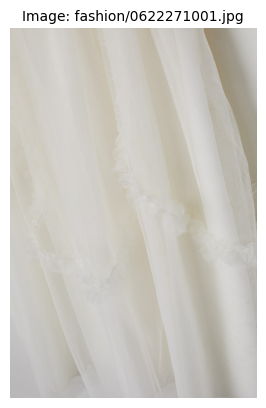

In [25]:
view_image(point1)

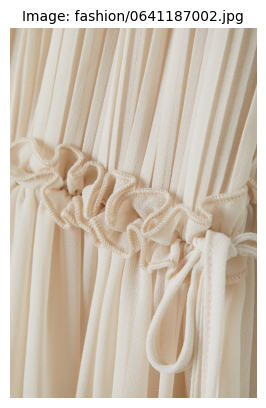

In [26]:
view_image(point2)

### An example of a map:

![Image](map1.png)

> In the next notebook we will do some visual search 

### We can use UMAP to reduce the dimensions and views some similar images

Dimensionality reduction is a valuable tool utilized by machine learning practitioners to gain insights and interpret large, complex datasets that have a high number of dimensions. Among the visualization techniques available, t-SNE is popular, but it may be challenging to use and may perform poorly with larger datasets. Recently, McInnes et al. developed a new method called UMAP, which offers several advantages over t-SNE, such as faster computation and better preservation of the data's global structure. This article aims to delve into the theory behind UMAP, explore its effectiveness in practice, and compare its performance with that of t-SNE.

In [27]:
print("Running Umap on the images vectors embeddings...")

start = time.time()
umap_2d = UMAP(n_components=2, init="random", random_state=0)
proj_2d = umap_2d.fit_transform(list_emb)

print("Done")
elapsed = time.time() - start
print(
    "Elapsed time: "
    + time.strftime(
        "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)
    )
)

Running Umap on the images vectors embeddings...
Done
Elapsed time: 00:00:12.666413


In [28]:
fig_2d = px.scatter(
    proj_2d,
    x=0,
    y=1,
    color=image_files,
    title="Images Vectors Embeddings UMAP Projections",
)

fig_2d.update_traces(marker_size=5, showlegend=False)
fig_2d.show()

## Image output:
![Image](umap1.png)

In [29]:
print("Running Umap on the images vectors embeddings...")

start = time.time()
umap_3d = UMAP(n_components=3, init="random", random_state=0)
proj_3d = umap_3d.fit_transform(list_emb)

print("Done")
elapsed = time.time() - start
print(
    "Elapsed time: "
    + time.strftime(
        "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)
    )
)

Running Umap on the images vectors embeddings...
Done
Elapsed time: 00:00:05.397139


In [30]:
fig_3d = px.scatter_3d(
    proj_3d,
    x=0,
    y=1,
    z=2,
    color=image_files,
    title="Images Vectors Embeddings UMAP Projections",
)

fig_3d.update_traces(marker_size=3, showlegend=False)
fig_3d.show()

## Image output:
![Image](umap2.png)